# Housing Sales & Venues Data Analysis  of North East England
## Fern Vass


## 1 . Introduction

### 1.1 The North East 

 North East England is one of nine official regions of England at the first level of NUTS. It is known as being the cheapest region in England based on average house prices taken January 2020 with a monthly price drop of 2.6% since December 2019. 
 
 The most populous city in the North East is Newcastle which is the eighth most populous urban area in the UK. It hosts many major corporate headquarters and has strengths in learning, digital technology, retail, tourism and cultural centres. Investment property comprises a large proportion of terraced housing.Towards the city centre, there are many large, impressive Georgian structures however large family homes are available towards the outer areas and many new-build developments have emerged around the city. Newcastle beings in many students as it hoses Newcastle Univeristy and Northumbria University so there many many student lets especially towards the centre of the city. 

From the perspective of a property investor/landlord, we will want to be able to able to clearly visualise the average house sale prices in different areas so we can straight away narrow down the areas with houses we are looking to buy into. We are looking mainly to find the ideal place for landlords to purchase their next home and aiming display the average house price for each area as well as trying to cluster particular areas by the venue types around them to give a rough idea of the environment they are buying into. As we are looking at homes for long-term tenants, we will be looking at Newcastle, Durham, Sunderland, South Tyneside and North Tyneside. 

### 1.2 Data

 1. We will be looking at the Lower Layer Super Output Areas (LSOA) of the UK and assign the median house prices to these areas. We can download this data last updated September 2019 from the [Office for National Statistics](https://www.ons.gov.uk/peoplepopulationandcommunity/housing/bulletins/housepricestatisticsforsmallareas/yearendingseptember2019) This will be cleaned so we gather data for Newcastle Upon Tyne, County Durham, Sunderland, South Tyneside and North Tyneside. 
 
 2. To be able to visuaulise this on a map, we will need the boundaries of each LSOA area which we can pull from this [UK-GeoJSON project](https://martinjc.github.io/UK-GeoJSON/). These are given as TopoJSON files so we will convert them to geojson using an [online converter](https://jeffpaine.github.io/geojson-topojson/) and merging them using an [online GeoJSON merger](https://tools.knowledgewalls.com/onlinejsonmerger). Now we can plot the choropleth data onto the map.
 
 3. To be able to cluster the data, we will add markers onto the map at the centroid location of each area. We can gather the centroid coordinates from another csv file provided by the [Office for National Statistics](https://geoportal.statistics.gov.uk/datasets/lower-layer-super-output-areas-december-2011-population-weighted-centroids/data?geometry=-2.107%2C54.912%2C-1.352%2C55.050&orderBy=lsoa11nm&orderByAsc=false&page=10). Again we will clean this CSV file to give us our north east areas. 
 
 4. Using these centroid locations for each area, we can pull up the 10 most common venues around these areas use FourSquare API and we can use k-means clustering to cluster this data by venues.


## 2 . Methodology

In [5]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge  folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Libraries imported.


### 2.1 Cleaning the data

 We will be looking at the Lower Layer Super Output Areas (LSOA) of the UK and assign the median house prices to these areas. We can download this data last updated September 2019 from the [Office for National Statistics](https://www.ons.gov.uk/peoplepopulationandcommunity/housing/bulletins/housepricestatisticsforsmallareas/yearendingseptember2019). After gathering relevant data for Newcastle Upon Tyne, County Durham, Sunderland, South Tyneside and North Tyneside which is given [here](https://raw.githubusercontent.com/fernvass/NErealestate/master/NEhouseprices.csv), we will clean it getting rid of any null values and coverting the string prices to integers. The first 5 rows of our dataframe are now displayed below. 

In [4]:
df = pd.read_csv("https://raw.githubusercontent.com/fernvass/NErealestate/master/NEhouseprices.csv", thousands=',')

df = df.dropna()
df = df[df.houseprice != 'Null']
df = df[df.houseprice != ':']

df['houseprice1'] = df['houseprice']
df.index = range(len(df))

for i in range(0, len(df['houseprice'])):
    a = df['houseprice'][i]
    df['houseprice'][i] = int("".join(a.split(",")))

df.head()

,LSOAcode,LSOAname,houseprice,houseprice1
0,E01020591,County Durham 015B,168000,"168,000"
1,E01020592,County Durham 011A,87000,"87,000"
2,E01020593,County Durham 011B,84000,"84,000"
3,E01020594,County Durham 013A,88000,"88,000"
4,E01020595,County Durham 013B,196250,"196,250"


## 2.2 Adding choropleth map based on house prices

To be able to visualise this on a map, we will need the boundaries of each LSOA area which we can pull from this [UK-GeoJSON project](https://martinjc.github.io/UK-GeoJSON/). These are given as TopoJSON files so after converting to GeoJSON and merging all the boundaries, we have all the boundaries of all the LSOA areas we want [here](https://raw.githubusercontent.com/fernvass/NErealestate/master/merged.geojson). Now we can plot the choropleth data onto the map.


In [9]:
latitude = 54.776100
longitude = -1.573300
# create map of Newcastle using latitude and longitude values
map_northeast = folium.Map(location=[latitude, longitude], zoom_start=10)

from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/fernvass/NErealestate/master/merged.geojson') as response:
    northeast_areas = json.load(response)

map_northeast.choropleth(
    geo_data= northeast_areas, #Boundaries
    data = df,
    columns =['LSOAcode', 'houseprice'],
    key_on='feature.properties.LSOA11CD'  ,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average house price in Newcastle',
    reset=True
)
map_northeast

## 2.3 Adding centroid markers onto map

We can obtain the latitdue and longitude for each lower layer output area centroid using data from the [Office of National Statisics](https://geoportal.statistics.gov.uk/datasets/lower-layer-super-output-areas-december-2011-population-weighted-centroids/data?geometry=-2.107%2C54.912%2C-1.352%2C55.050&orderBy=lsoa11nm&orderByAsc=false&page=10).

We download the CSV file for the UK and clean it again so we get [our specific areas](https://raw.githubusercontent.com/fernvass/NErealestate/master/LSOAlatlong.csv). Our data gives use the X,Y Northing-Easting cooridinates so we'll convert them into latitude and longitude values for each centroid to our dataframe. WD15NM is our ward name which we will add to our label. 

In [69]:
df1 = pd.read_csv("https://raw.githubusercontent.com/fernvass/NErealestate/master/LSOAlatlong.csv")

import math

# Ellipsoid parameters for different datums (m): semi-major axis, a, and
# semi-minor axis, b.
datum_ellipsoid = {
    # Airy 1830 ellipsoid
    'osgb36': {'a': 6.377563396e6,
               'b': 6.356256909e6
              },
    # WGS84 ellipsoid parameters
    'wgs84':  {'a': 6.378137e6,
               'b': 6.3567523141e6
              },
    }

# Transverse Mercator projection parameters: Map coordinates of true origin,
# (E0, N0), scale factor on central meridian, F0, true origin (phi0, lambda0).
N0 = -100000
E0 = 400000
F0 = 0.9996012717
phi0 = math.radians(49)
lambda0 = math.radians(-2)

def fM(phi, a, b):
    """Return the parameter M for latitude phi using ellipsoid params a, b."""

    n = (a-b)/(a+b)
    n2 = n**2
    n3 = n * n2
    dphi, sphi = phi - phi0, phi + phi0
    M = b * F0 * (
            (1 + n + 5/4 * (n2+n3)) * dphi
          - (3*n + 3*n2 + 21/8 * n3) * math.sin(dphi) * math.cos(sphi)
          + (15/8 * (n2 + n3)) * math.sin(2*dphi) * math.cos(2*sphi)
          - (35/24 * n3 * math.sin(3*dphi) * math.cos(3*sphi))
        )
    return M

def dms_pretty_print(d, m ,s, latlong, ndp=4):
    """Return a prettified string for angle d degrees, m minutes, s seconds."""

    if latlong=='latitude':
        hemi = 'N' if d>=0 else 'S'
    elif latlong=='longitude':
        hemi = 'E' if d>=0 else 'W'
    else:
        hemi = '?'
    return '{d:d}° {m:d}′ {s:.{ndp:d}f}″ {hemi:1s}'.format(
                d=abs(d), m=m, s=s, hemi=hemi, ndp=ndp)

def deg_to_dms(deg, pretty_print_latlong=None, ndp=4):
    """Convert from decimal degrees to degrees, minutes, seconds."""

    m, s = divmod(abs(deg)*3600, 60)
    d, m = divmod(m, 60)
    if deg < 0:
        d = -d
    d, m = int(d), int(m)

    if pretty_print_latlong:
        return dms_pretty_print(d, m, s, pretty_print_latlong)
    return d, m, s

def dms_to_deg(d, m, s):
    """Convert from degrees, minutes, seconds to decimal degrees."""
    return d + m/60 + s/3600

def get_prms(phi, a, F0, e2):
    """Calculate and return the parameters rho, nu, and eta2."""

    rho = a * F0 * (1-e2) * (1-e2*math.sin(phi)**2)**-1.5
    nu = a * F0 / math.sqrt(1-e2*math.sin(phi)**2)
    eta2 = nu/rho - 1
    return rho, nu, eta2

def os_to_ll(E, N, datum='osgb36'):
    """Convert from OS grid reference (E, N) to latitude and longitude.

    Latitude, phi, and longitude, lambda, are returned in degrees.

    """

    a, b = datum_ellipsoid[datum]['a'], datum_ellipsoid[datum]['b']
    e2 = (a**2 - b**2)/a**2
    M, phip = 0, phi0
    while abs(N-N0-M) >= 1.e-5:
        phip = (N - N0 - M)/(a*F0) + phip
        M = fM(phip, a, b)

    rho, nu, eta2 = get_prms(phip, a, F0, e2)

    tan_phip = math.tan(phip)
    tan_phip2 = tan_phip**2
    nu3, nu5 = nu**3, nu**5
    sec_phip = 1./math.cos(phip)

    c1 = tan_phip/2/rho/nu
    c2 = tan_phip/24/rho/nu3 * (5 + 3*tan_phip2 + eta2 * (1 - 9*tan_phip2))
    c3 = tan_phip / 720/rho/nu5 * (61 + tan_phip2*(90 + 45 * tan_phip2))
    d1 = sec_phip / nu
    d2 = sec_phip / 6 / nu3 * (nu/rho + 2*tan_phip2)
    d3 = sec_phip / 120 / nu5 * (5 + tan_phip2*(28 + 24*tan_phip2))
    d4 = sec_phip / 5040 / nu**7 *  (61 + tan_phip2*(662 + tan_phip2*
                                                    (1320 + tan_phip2*720)))
    EmE0 = E - E0
    EmE02 = EmE0**2
    phi = phip + EmE0**2 * (-c1 + EmE02*(c2 - c3*EmE02))
    lam = lambda0 + EmE0 * (d1 + EmE02*(-d2 + EmE02*(d3 - d4*EmE02)))
    return math.degrees(phi), math.degrees(lam)


In [72]:
df2 = pd.merge(df, df1, on=['LSOAcode'])
df2 = df2[['LSOAcode', 'LSOAname', 'houseprice', 'Latitude', 'Longitude']]
df3 = pd.read_csv("https://raw.githubusercontent.com/fernvass/NErealestate/master/wards.csv")

df4 = pd.merge(df2, df3, on=['LSOAcode'])

df4 = df4[['LSOAcode', 'LSOAname', 'houseprice', 'Latitude', 'Longitude', 'WD15NM']]
for i in range(0, len(df4['Latitude'])):
    x,y = df4['Latitude'][i], df4['Longitude'][i] 
    a = os_to_ll(x, y) 
    df4['Latitude'][i], df4['Longitude'][i] = a[0],a[1]


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [64]:
df4.head()

,LSOAcode,LSOAname,houseprice,Latitude,Longitude,WD15NM
0,E01020591,County Durham 015B,168000,54.854128,-1.514874,Lumley
1,E01020592,County Durham 011A,87000,54.856330,-1.583208,Chester-le-Street West Central
2,E01020593,County Durham 011B,84000,54.854644,-1.576591,Chester-le-Street West Central
3,E01020594,County Durham 013A,88000,54.849857,-1.572715,Chester-le-Street East
4,E01020595,County Durham 013B,196250,54.850199,-1.566768,Chester-le-Street East


Now we want to plot the centroid onto our map and have the labels display houseprice, ward and LASO name.

In [73]:
for lat, lng, ward, houseprice,area  in zip(df4['Latitude'], df4['Longitude'], df4['WD15NM'],df['houseprice1'], df4['LSOAname']):
    label = '{}, {},{}'.format(houseprice, ward, area)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_northeast)  
    
map_northeast

## 2.4 Pulling up the top 10 Venues for each area

Using the FourSquare API, we can use the latitude and longitude for each area and get the nearby venues around them using the limit of 100 venues and radius of 500m for each point. Now for each area name (ward), we can list the top 10 most common venues as shown below.

In [24]:
CLIENT_ID = 'K1MEEYQYR5IER4EVRKTB340HSOUYBA0VTLTEM4E3UV2H45LS' # your Foursquare ID
CLIENT_SECRET = 'FLSEQMMHPW5VVFIX2LMYOBMSIMV4UJUF3XSNEF3FXKRYPJAJ' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

#print('Your credentails:')
#print('CLIENT_ID: ' + CLIENT_ID)
#print('CLIENT_SECRET:' + CLIENT_SECRET)
northeast_df = df4 
area_latitude = northeast_df.loc[0, 'Latitude'] # neighborhood latitude value
area_longitude = northeast_df.loc[0, 'Longitude'] # neighborhood longitude value

area_name = northeast_df.loc[0, 'WD15NM'] # neighborhood name

#print('Latitude and longitude values of {} are {}, {}.'.format(area_name, 
                                                               #area_latitude, 
                                                               #area_longitude))
        
LIMIT = 100 # limit of number of venues returned by Foursquare API

radius = 500 # define radius

# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    area_latitude, 
    area_longitude, 
    radius, 
    LIMIT)
url # display URL

results = requests.get(url).json()

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']
    
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))
nearby_venues.head()

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Area_Name', 
                  'Area Latitude', 
                  'Area Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)
northeast_venues = getNearbyVenues(names=northeast_df['WD15NM'],
                                   latitudes= northeast_df['Latitude'],
                                   longitudes= northeast_df['Longitude'])

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:49: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead


2 venues were returned by Foursquare.
Lumley
Chester-le-Street West Central
Chester-le-Street West Central
Chester-le-Street East
Chester-le-Street East
Chester-le-Street North
Chester-le-Street North
North Lodge
Chester-le-Street South
Chester-le-Street South
Chester-le-Street West Central
Chester-le-Street West Central
Chester-le-Street South
Chester-le-Street South
Chester-le-Street South
Pelton
Sacriston
Lumley
Lumley
Lumley
North Lodge
North Lodge
Pelton
Pelton
Pelton
Pelton
Pelton
Chester-le-Street West Central
Sacriston
Sacriston
Sacriston
Pelton
Pelton
Annfield Plain
Annfield Plain
Annfield Plain
Benfieldside
Benfieldside
Benfieldside
Benfieldside
Benfieldside
Consett North
Lanchester
Burnopfield and Dipton
Burnopfield and Dipton
Burnopfield and Dipton
Lanchester
Annfield Plain
Annfield Plain
Delves Lane
Consett North
Consett North
Consett North
Consett South
Consett South
Deerness
Stanley
Stanley
Craghead and South Moor
Delves Lane
Delves Lane
Delves Lane
Burnopfield and Dipto

In [34]:
northeast_venues.groupby('Area_Name').count()
# one hot encoding
northeast_onehot = pd.get_dummies(northeast_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
northeast_onehot['Area_Name'] = northeast_venues['Area_Name'] 


# move neighborhood column to the first column
fixed_columns = [northeast_onehot.columns[-1]] + list(northeast_onehot.columns[:-1])
northeast_onehot = northeast_onehot[fixed_columns]

northeast_grouped = northeast_onehot.groupby('Area_Name').mean().reset_index()

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Area_Name']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Area_Name'] = northeast_grouped['Area_Name']

for ind in np.arange(northeast_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(northeast_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Area_Name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Annfield Plain,IT Services,Supermarket,Park,Construction & Landscaping,Soccer Field,Cupcake Shop,Cricket Ground,Laser Tag,Funeral Home,Chinese Restaurant
1,Aycliffe East,Supermarket,Soccer Field,Cricket Ground,Convenience Store,Warehouse Store,Gym / Fitness Center,Fast Food Restaurant,Grocery Store,Bakery,Bus Stop
2,Aycliffe North and Middridge,Bus Stop,Bar,Supermarket,Food,Pharmacy,Pizza Place,Food & Drink Shop,Indian Restaurant,Pub,Construction & Landscaping
3,Aycliffe West,Pub,Bar,Bus Stop,Convenience Store,Playground,Pizza Place,Photography Studio,Pharmacy,Fast Food Restaurant,Supermarket
4,Barnard Castle East,Café,Gym / Fitness Center,Pub,Supermarket,Museum,Coffee Shop,Zoo,Food Service,Flower Shop,Food


## 2.5 K-Means Clustering

K-means clustering is an unsupervised method which we will use to cluster the wards. First we want to our our optimum value, k, which is the number of clusters we should have to give us the best grouping. 

Below we can see using the elbow method to determine the optimal k is not giving use a very clear 'knee'. So we will look to perhaps using other methods for find the optimal number of clusters such as the silhouette method. 

Text(0.5, 1.0, 'Elbow Method For Optimal k')

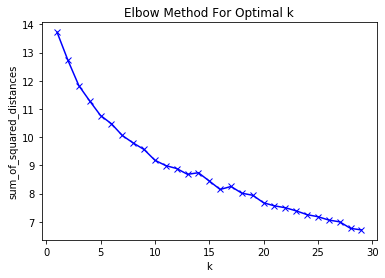

In [43]:
northeast_grouped_clustering = northeast_grouped.drop('Area_Name', 1)

sum_of_squared_distances = []
K = range(1,30)
for k in K:
    #print(k, end=' ')
    kmeans = KMeans(n_clusters=k).fit(northeast_grouped_clustering)
    sum_of_squared_distances.append(kmeans.inertia_)

import matplotlib.pyplot as plt
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')


Below, the Silhouette method suggests 4 clusters maximises the average silhouette values, 10 clusters coming in as second optimal number of clusters.
So using this we will use K-means with k=4.

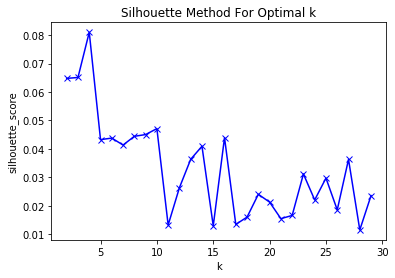

In [44]:

from sklearn.metrics import silhouette_score
sil = []
K_sil = range(2,30)
# minimum 2 clusters required, to define dissimilarity
for k in K_sil:
    #print(k, end=' ')
    kmeans = KMeans(n_clusters = k).fit(northeast_grouped_clustering)
    labels = kmeans.labels_
    sil.append(silhouette_score(northeast_grouped_clustering, labels, metric = 'euclidean'))
    
plt.plot(K_sil, sil, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette_score')
plt.title('Silhouette Method For Optimal k')
plt.show()

## 4. Results

### 4.1 Analysing clusters

So now we have our optimal k, we can cluster the areas easily.Below we can see our merged table containing the area names, their corresponding cluster labels and their top 10 most common venues. 

In [76]:
# set number of clusters
kclusters = 4


#newcastle_grouped_clustering = newcastle_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(northeast_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

# add clustering labels
#neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
neighborhoods_venues_sorted
northeast_merged = northeast_df

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
northeast_merged = northeast_merged.join(neighborhoods_venues_sorted.set_index('Area_Name'), on='WD15NM')
northeast_merged = northeast_merged.dropna(subset = ['Cluster Labels'])

#reset index of rows 
northeast_merged.reset_index(inplace = True, drop=True)
northeast_merged = northeast_merged.astype({"Cluster Labels": int })
northeast_merged['houseprice'] = df['houseprice1']
northeast_merged.head()

,LSOAcode,LSOAname,houseprice,Latitude,Longitude,WD15NM,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,E01020591,County Durham 015B,"168,000",54.854128,-1.514874,Lumley,1,Pub,Grocery Store,Bus Stop,Cosmetics Shop,Electronics Store,Gaming Cafe,Furniture / Home Store,Funeral Home,Fried Chicken Joint,Fish & Chips Shop
1,E01020592,County Durham 011A,"87,000",54.856330,-1.583208,Chester-le-Street West Central,1,Pub,Coffee Shop,Supermarket,Discount Store,Food & Drink Shop,Doctor's Office,Indian Restaurant,Convenience Store,Construction & Landscaping,Grocery Store
2,E01020593,County Durham 011B,"84,000",54.854644,-1.576591,Chester-le-Street West Central,1,Pub,Coffee Shop,Supermarket,Discount Store,Food & Drink Shop,Doctor's Office,Indian Restaurant,Convenience Store,Construction & Landscaping,Grocery Store
3,E01020594,County Durham 013A,"88,000",54.849857,-1.572715,Chester-le-Street East,1,Pub,Playground,Bar,Entertainment Service,Gym,Auto Workshop,Locksmith,Park,Restaurant,Cricket Ground
4,E01020595,County Durham 013B,"196,250",54.850199,-1.566768,Chester-le-Street East,1,Pub,Playground,Bar,Entertainment Service,Gym,Auto Workshop,Locksmith,Park,Restaurant,Cricket Ground


Now, we want to analyse the venues in the different clusters and assign a clear label that can tell us information about the type of area of each ward.

### Cluster 0

In [51]:

required_column_indices = [7]
required_column = [list(northeast_merged.columns.values)[i] for i in required_column_indices]
required_column_indices = [7]

cluster_0 = northeast_merged.loc[northeast_merged['Cluster Labels'] == 0, northeast_merged.columns[1:12]]

for col in required_column:
    print(cluster_0[col].value_counts(ascending = False))
    print("---------------------------------------------")


Supermarket                   101
Bus Stop                       29
Grocery Store                  23
Clothing Store                 17
Discount Store                 13
Pizza Place                    11
Construction & Landscaping     10
Gym                             8
Park                            8
Coffee Shop                     7
Home Service                    7
Golf Course                     7
Fast Food Restaurant            6
Locksmith                       6
Sandwich Place                  6
IT Services                     5
Café                            5
Italian Restaurant              4
Name: 1st Most Common Venue, dtype: int64
---------------------------------------------


### Cluster 1

In [52]:

cluster_1 = northeast_merged.loc[northeast_merged['Cluster Labels'] == 1, northeast_merged.columns[1:12]]

for col in required_column:
    print(cluster_1[col].value_counts(ascending = False))
    print("---------------------------------------------")

Pub                           251
Bar                            27
Grocery Store                  25
Chinese Restaurant             12
Coffee Shop                    10
Entertainment Service           9
Locksmith                       8
Light Rail Station              8
Indian Restaurant               7
Italian Restaurant              6
Construction & Landscaping      6
Garden Center                   6
Gym / Fitness Center            6
Restaurant                      5
Café                            5
Beach                           5
Sandwich Place                  3
Name: 1st Most Common Venue, dtype: int64
---------------------------------------------


### Cluster 2

In [53]:
cluster_2 = northeast_merged.loc[northeast_merged['Cluster Labels'] == 2, northeast_merged.columns[1:12]]

for col in required_column:
    print(cluster_2[col].value_counts(ascending = False))
    print("---------------------------------------------")

Bar                           25
Grocery Store                 22
Pizza Place                   20
Pub                           19
Convenience Store             17
Construction & Landscaping    15
Home Service                  10
Bus Stop                       8
Deli / Bodega                  7
Stadium                        7
Playground                     7
Hotel                          7
Italian Restaurant             6
Chinese Restaurant             6
Pedestrian Plaza               6
Fish & Chips Shop              6
Golf Course                    6
Fast Food Restaurant           6
Café                           5
Discount Store                 5
Park                           3
Name: 1st Most Common Venue, dtype: int64
---------------------------------------------


### Cluster 3

In [54]:
cluster_3 = northeast_merged.loc[northeast_merged['Cluster Labels'] == 3, northeast_merged.columns[1:12]]

for col in required_column:
    print(cluster_3[col].value_counts(ascending = False))
    print("---------------------------------------------")
    

Hotel    1
Name: 1st Most Common Venue, dtype: int64
---------------------------------------------


### 4.2 Assigning Cluster Labels

Analysing above, we may label the clusters as such:

1. Cluster 0: High-street areas
2. Cluster 1: Pub, Bars & Restaurants
3. Cluster 2: Mixed Social Venues
4. Cluster 3: Accomodation 


In [78]:
mapping = {0: 'High-street areas', 1: 'Pub, Bars & Restaurants', 2: 'Mixed Social Venues', 3:'Accomodation '}

new_labels = northeast_merged.replace({'Cluster Labels': mapping})
northeast_merged['New Cluster Labels'] = new_labels['Cluster Labels']

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)

map_clusters.choropleth(
    geo_data= northeast_areas, #Boundaries
    data = df,
    columns =['LSOAcode', 'houseprice'],
    key_on='feature.properties.LSOA11CD'  ,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average house price in Newcastle',
    reset=True
)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
colour = ['aqua','deeppink','springgreen', 'orangered']
# add markers to the map
markers_colors = []
for lat, lon, poi, cluster, labels, houseprice in zip(northeast_merged['Latitude'], northeast_merged['Longitude'],northeast_merged['WD15NM'],northeast_merged['Cluster Labels'], northeast_merged['New Cluster Labels'],northeast_merged['houseprice']):
    label = '{},{},{}'.format(houseprice, str(poi), labels)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=colour[cluster],
        fill= True,
        fill_color=colour[cluster],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## 5. Discussion 

Now we have the basic level of information about the areas and house prices in the North East. There are many more things we 
could explore that would be of use to property/investors landlords. We could also add to the areas the average rental price in that particular area which would give more insight into the returns on the investment. When analysing the market before we invest, we also want to take a look at factors such as:

1. Average household income & income growth 
2. Average crime rate in the area
3. Population growth 
4. Job growth

If we wanted to expand beyond the North East and look at pother possible areas in the UK to invest in we would want to add in this information for better analysis of the market.

For areas with Universities, we may also want to make clear the areas where students tend to be living so landlords can get a good idea on where  students are situated (they may want to invest here for the purpose of student lets or even avoid these areas altogether). 

## 6. Conclusion

Real estate is a big market which many people are trying to enter. The key to being successful to to be able to analyse the market and do enough research on your area before jumping straight in. By performing this analysis, we can pick the right areas to buy based on price and social environment. For landlord looking for mainly, families, they may target 'Mixed social venues' areas with a price range £50,000-£80,000 sale price. 

With access to location data using platforms such as FourSquare, we can use data analysis to give us quick answers to find areas we want to invest in based on our own desires for the property. 

## References


 1. [2019 House Sales Price by LSOA](https://www.ons.gov.uk/peoplepopulationandcommunity/housing/bulletins/housepricestatisticsforsmallareas/yearendingseptember2019)
 
 2. [UK Boundary GeoJSON files](https://martinjc.github.io/UK-GeoJSON/)
 
 3. [Centroid data by LSOA](https://geoportal.statistics.gov.uk/datasets/lower-layer-super-output-areas-december-2011-population-weighted-centroids/data?geometry=-2.107%2C54.912%2C-1.352%2C55.050&orderBy=lsoa11nm&orderByAsc=false&page=10)
 
 4. [FourSquare API](https://developer.foursquare.com/)
